This code is written with the help of the github reference provided in the assignment as it waas allowed in the comment section of GC

In [1]:
import os
import torch
import torch.nn.functional as F
from PIL import Image
import torchvision.transforms as T
import numpy as np
from bert.tokenization_bert import BertTokenizer
from bert.modeling_bert import BertModel
from lib import segmentation
import matplotlib.pyplot as plt

/home/zeus/miniconda3/envs/cloudspace/lib/python3.7/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dict1 = {
    "ILSVRC2012_test_00000003.jpg": "The walking dog in the picture",
    "ILSVRC2012_test_00000004.jpg": "The smiling dog in the grass",
    "ILSVRC2012_test_00000018.jpg": "The boy on left smiling and holding icecream",
    "ILSVRC2012_test_00000019.jpg": "The black gray bird on in the picture",
    "ILSVRC2012_test_00000022.jpg": "The sad dog standing beside the pool",
    "ILSVRC2012_test_00000023.jpg": "The guy in white shirt on the bicycle",
    "ILSVRC2012_test_00000025.jpg": "The butterfly in the picture",
    "ILSVRC2012_test_00000026.jpg": "The man wearing a suit and tie",
    "ILSVRC2012_test_00000030.jpg": "The duck in the picture",
    "ILSVRC2012_test_00000034.jpg": "The white coffee cups on the coffee machine"
}

dict2 = {
    "ILSVRC2012_test_00000003.jpg": "text on the wall",
    "ILSVRC2012_test_00000004.jpg": "tail of the dog",
    "ILSVRC2012_test_00000018.jpg": "swimming pool behind the people",
    "ILSVRC2012_test_00000019.jpg": "plant behind the bird",
    "ILSVRC2012_test_00000022.jpg": "a roaring lion",
    "ILSVRC2012_test_00000023.jpg": "telephone pole near the shop",
    "ILSVRC2012_test_00000025.jpg": "green coloured insect bottom left",
    "ILSVRC2012_test_00000026.jpg": "The sofa",
    "ILSVRC2012_test_00000030.jpg": "water in the picture",
    "ILSVRC2012_test_00000034.jpg": "the coffee machine"
}

weights = './checkpoints/refcoco.pth'
device = 'cpu'

In [3]:
def preprocess_image(image_path, device):
    img = Image.open(image_path).convert("RGB")
    img_ndarray = np.array(img)  
    original_w, original_h = img.size  

    image_transforms = T.Compose(
        [
            T.Resize(480),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ]
    )

    img = image_transforms(img).unsqueeze(0)  
    img = img.to(device) 
    return img, img_ndarray, original_w, original_h

def preprocess_sentence(sentence, tokenizer, device):
    sentence_tokenized = tokenizer.encode(text=sentence, add_special_tokens=True)
    sentence_tokenized = sentence_tokenized[:20] 
    padded_sent_toks = [0] * 20
    padded_sent_toks[:len(sentence_tokenized)] = sentence_tokenized
    attention_mask = [0] * 20
    attention_mask[:len(sentence_tokenized)] = [1] * len(sentence_tokenized)

    padded_sent_toks = torch.tensor(padded_sent_toks).unsqueeze(0).to(device) 
    attention_mask = torch.tensor(attention_mask).unsqueeze(0).to(device)  
    return padded_sent_toks, attention_mask

Window size 12!
Randomly initialize Multi-modal Swin Transformer weights.


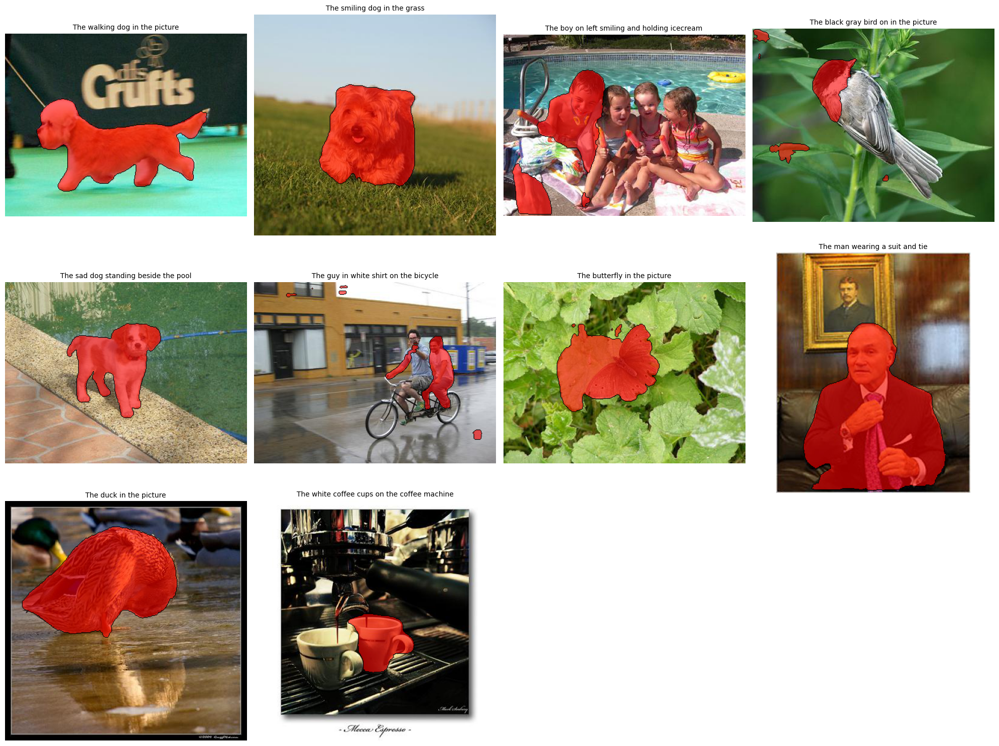

In [4]:
def overlay_davis(image, mask, colors=[[0, 0, 0], [255, 0, 0]], cscale=1, alpha=0.4):
    from scipy.ndimage.morphology import binary_dilation

    colors = np.reshape(colors, (-1, 3))
    colors = np.atleast_2d(colors) * cscale

    im_overlay = image.copy()
    object_ids = np.unique(mask)

    for object_id in object_ids[1:]:
        foreground = image * alpha + np.ones(image.shape) * (1 - alpha) * np.array(colors[object_id])
        binary_mask = mask == object_id

        im_overlay[binary_mask] = foreground[binary_mask]
        countours = binary_dilation(binary_mask) ^ binary_mask
        im_overlay[countours, :] = 0

    return im_overlay.astype(image.dtype)


def visualize(image_sentence_dict, weights, device):
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

    class args:
        swin_type = 'base'
        window12 = True
        mha = ''
        fusion_drop = 0.0

    single_model = segmentation.__dict__['lavt'](pretrained='', args=args)
    single_model.to(device)
    model_class = BertModel
    single_bert_model = model_class.from_pretrained('bert-base-uncased')
    single_bert_model.pooler = None

    checkpoint = torch.load(weights, map_location='cpu')
    single_bert_model.load_state_dict(checkpoint['bert_model'])
    single_model.load_state_dict(checkpoint['model'])
    model = single_model.to(device)
    bert_model = single_bert_model.to(device)


    visualizations = []
    for img_filename, sentence in image_sentence_dict.items():
        image_path = os.path.join('./samples/', img_filename)

        img, img_ndarray, original_w, original_h = preprocess_image(image_path, device)
        padded_sent_toks, attention_mask = preprocess_sentence(sentence, tokenizer, device)

        last_hidden_states = bert_model(padded_sent_toks, attention_mask=attention_mask)[0]
        embedding = last_hidden_states.permute(0, 2, 1)
        output = model(img, embedding, l_mask=attention_mask.unsqueeze(-1))
        output = output.argmax(1, keepdim=True)  
        output = F.interpolate(output.float(), (original_h, original_w))  
        output = output.squeeze().cpu().data.numpy()  

       
        output = output.astype(np.uint8)
        visualization = overlay_davis(img_ndarray, output)
        visualizations.append((sentence, visualization))

    rows = 3  
    cols = 4 

   
    num_images = len(visualizations)
    fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
    axes = axes.flatten() if num_images > 1 else [axes]

    for i, (sentence, visualization) in enumerate(visualizations):
        ax = axes[i]
        ax.imshow(visualization)
        ax.set_title(sentence, fontsize=10)
        ax.axis('off')

    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

visualize(dict1, weights, device)

Window size 12!
Randomly initialize Multi-modal Swin Transformer weights.


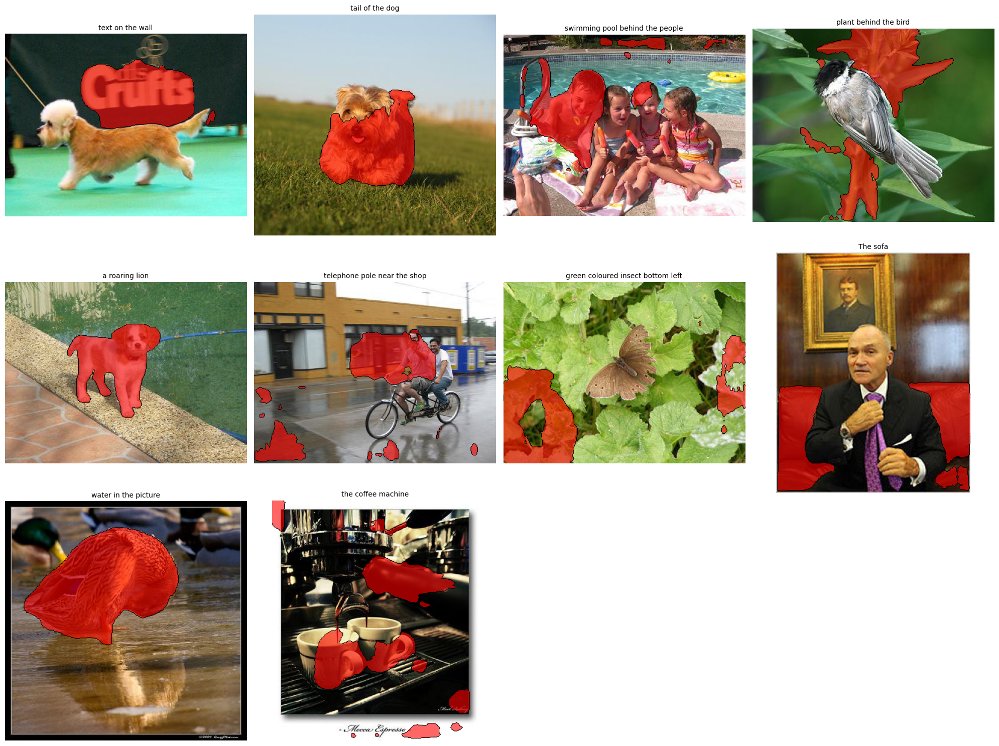

In [5]:
visualize(dict2, weights, device)

Window size 12!
Randomly initialize Multi-modal Swin Transformer weights.


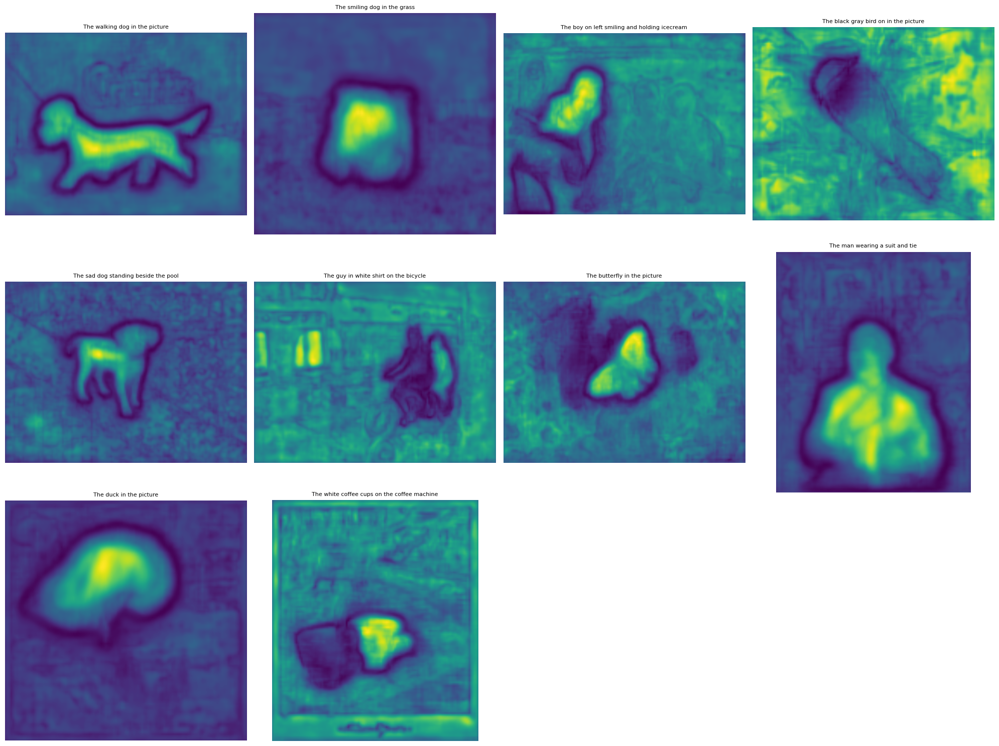

In [7]:
def visualize_y1(image_sentence_dict, weights, device, image_dir, rows=4, cols=3):
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

    class Args:
        swin_type = 'base'
        window12 = True
        mha = ''
        fusion_drop = 0.0
    args = Args()

    segmentation_model = segmentation.__dict__['lavt'](pretrained='', args=args)

    bert_model_class = BertModel
    bert_model = bert_model_class.from_pretrained('bert-base-uncased')
    bert_model.pooler = None

    checkpoint = torch.load(weights, map_location='cpu') 
    bert_model.load_state_dict(checkpoint['bert_model'])
    segmentation_model.load_state_dict(checkpoint['model'])

    segmentation_model.classifier.conv1_1 = torch.nn.Identity()

    segmentation_model.to(device)
    bert_model.to(device)
    segmentation_model.eval()
    bert_model.eval()

    results_to_plot = []

    for img_filename, sentence in image_sentence_dict.items():
        image_path = os.path.join(image_dir, img_filename)

        img_tensor, _, _, _ = preprocess_image(image_path, device)
        padded_sent_toks, attention_mask = preprocess_sentence(sentence, tokenizer, device)

        with torch.no_grad():
            last_hidden_states = bert_model(padded_sent_toks, attention_mask=attention_mask)[0] 
            text_embedding = last_hidden_states.permute(0, 2, 1)

            y1_output = segmentation_model(img_tensor, text_embedding, l_mask=attention_mask.unsqueeze(-1))

        y1_features = y1_output.cpu()
        y1_features = y1_features.squeeze(0)

        y1_agg = y1_features.mean(dim=0) 

        results_to_plot.append({'map': y1_agg, 'sentence': sentence})

    num_images = len(results_to_plot)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = axes.flatten() 

    for i, result in enumerate(results_to_plot):
        ax = axes[i]
        ax.imshow(result['map'], cmap='viridis')
        title = result['sentence']
        ax.set_title(title, fontsize=8)
        ax.axis('off')

    for j in range(num_images, len(axes)):
        axes[j].axis('off')

    plt.tight_layout() 
    plt.show()

visualize_y1(dict1, weights, device, './samples/', rows=3, cols=4)

Window size 12!
Randomly initialize Multi-modal Swin Transformer weights.


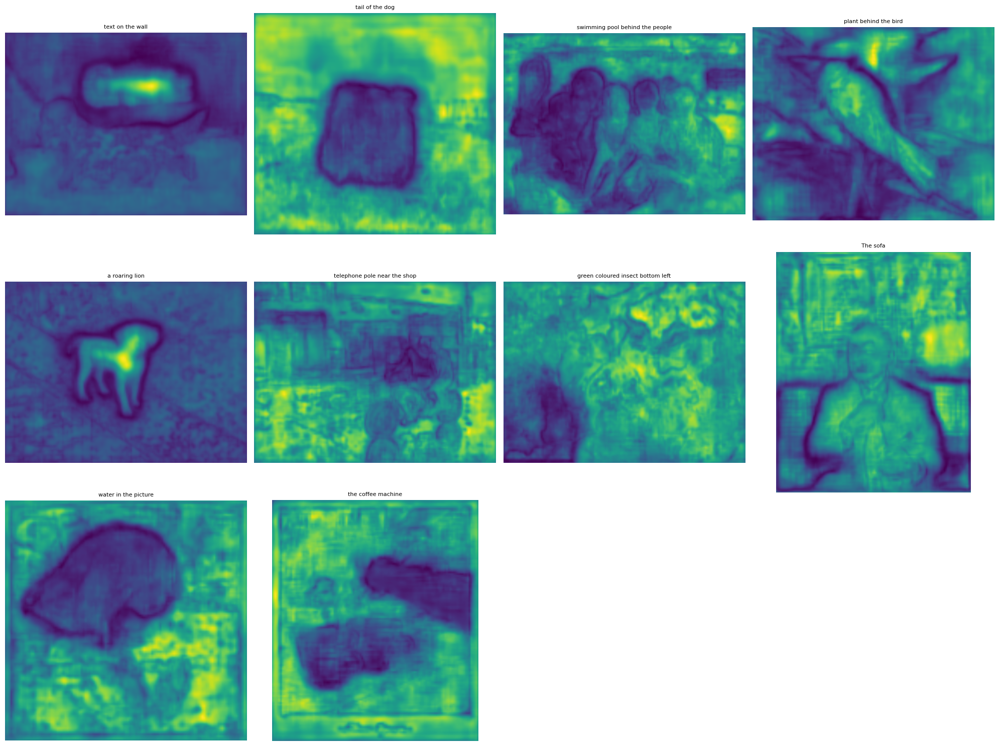

In [8]:
visualize_y1(dict2, weights, device, './samples/', rows=3, cols=4)